# Simulação de Monte Carlo

Imaginando a hipótese de que tenho uma carteira de 10 ações, dado a distribuição dos retornos dessa carteira no último ano:
- Qual o máximo que eu posso perder no próximo ano, com uma confiança de 95%?
- Qual a probabilidade de eu obter lucro?

Iremos fazer uma simulação de um grande número de carteiras (com diferentes valores de retorno e vol esperados) e ver as estatísticas relacionadas à distribuição de estatística deste modelo

### Importações

In [4]:
import numpy as np
import matplotlib.pyplot as plt
import datetime as dt
import yfinance as yf 
from numpy import linalg as LA

### Baixando dados necessários

In [2]:
lista_acoes = ["WEGE3", "PCAR3", "LREN3", "PETR4", "VALE3"]
lista_acoes = [acao + ".SA" for acao in lista_acoes]

data_final = dt.datetime.now()
data_inicial = data_final - dt.timedelta(days=300)

precos = yf.download(lista_acoes, data_inicial, data_final)["Adj Close"]

[*********************100%***********************]  5 of 5 completed


In [44]:
precos

Ticker,LREN3.SA,PCAR3.SA,PETR4.SA,VALE3.SA,WEGE3.SA
Date,,,,,
2024-01-02 00:00:00+00:00,16.682140,4.19,33.281128,71.151764,35.979404
2024-01-03 00:00:00+00:00,16.371956,4.63,34.320610,70.782379,36.254879
2024-01-04 00:00:00+00:00,15.732198,4.45,34.029907,69.831230,35.772800
2024-01-05 00:00:00+00:00,16.129622,4.10,34.109188,68.935486,35.389099
2024-01-08 00:00:00+00:00,16.749996,4.09,33.853725,68.584572,35.477646
...,...,...,...,...,...
2024-10-21 00:00:00+00:00,18.450001,3.14,36.250000,60.330002,55.040001
2024-10-22 00:00:00+00:00,18.160000,3.22,36.110001,60.410000,55.950001
2024-10-23 00:00:00+00:00,17.959999,3.32,35.660000,59.349998,56.200001


### Calculando os retornos e a sua cov

In [5]:
retornos = precos.pct_change().dropna()
media_retornos = retornos.mean()
matriz_cov = retornos.cov()
pesos_carteira = np.full(len(lista_acoes), 1/len(lista_acoes))
numero_acoes = len(lista_acoes)

pesos_carteira

array([0.2, 0.2, 0.2, 0.2, 0.2])

## Fórmula de retornos sintéticos

Retornos sintéticos = média retornos + Rpdf x L
- Rpdf = Matriz aleatória gerada por alguma função de densidade de probabilidade
- L = Matriz triangular inferior proveniente de uma decomposição de Cholesky, usando como base a matriz de cov<br>
dos dados originais

##  Por que fazer isso?

Nós assumimos que a distribuição de retornos é uma distribuição normal multivariada (expansão da distribuição normal)

Quando geramos retornos aleatórios de cada ativo, criamos vetores aleatórios descorrelacionados entre si. Para corrigir isto, precisamos correlacionar estes retornos e, para isso, usamos a matriz triangular obtida a partir da covariância.

In [6]:
num_sim = 10_000
dias_projetados = 252
capital_inicial = 1000

In [7]:
retorno_medio = retornos.mean(axis=0).to_numpy() # transforma em vetor
matriz_retorno_medio = retorno_medio * np.ones(shape=(dias_projetados, numero_acoes)) # gera matriz cheia dos retornos médios

In [17]:
L = LA.cholesky(matriz_cov) # triangulariz cov_matrix para correlacionar retornos sintéticos

In [28]:
retornos_carteira = np.zeros([dias_projetados, num_sim])
montante_final = np.zeros(num_sim)

for s in range(num_sim):
    Rpdf = np.random.normal(size=(dias_projetados, numero_acoes))

    retornos_sinteticos = matriz_retorno_medio + np.inner(Rpdf, L)

    retornos_carteira[:, s] = np.cumprod(np.inner(pesos_carteira,
                                                  retornos_sinteticos) + 1) * capital_inicial
    
    montante_final[s] = retornos_carteira[-1, s]


retornos_carteira

[[ 0.13227662  0.38775684 -1.50448778 -0.18221902  0.27131215]
 [ 0.58793464 -1.21502186 -0.14162104 -0.377811   -1.01258443]
 [-1.49476825  1.36505506  1.23556172  2.75758018  0.064392  ]
 ...
 [ 0.82868573  0.31126866  0.33824514 -0.47311807 -0.55159582]
 [ 0.27123077  0.8970402   0.2662602  -1.27379102  0.13512563]
 [ 0.02486498  1.29124246  0.96952975  2.01239483  0.51335636]]
[[ 0.00423204  0.01688625 -0.02378666 -0.00556155  0.00340684]
 [ 0.01598625 -0.04338076 -0.00217661 -0.00566159 -0.01439788]
 [-0.0377394   0.03816721  0.02074698  0.03637984  0.00913528]
 ...
 [ 0.02219669  0.02174437  0.00668071 -0.00351656 -0.00577278]
 [ 0.00781652  0.03928884  0.0055481  -0.01528686  0.00328513]
 [ 0.00146124  0.05257191  0.01715095  0.02996952  0.01573611]]
[[ 1.78644407  0.37384075  0.34718123  0.96732281  0.64894255]
 [-1.03400284 -0.89205607  2.19975838 -1.06814261 -0.79664046]
 [-0.24988993 -0.3304066   0.36647382 -0.51584189 -1.42800655]
 ...
 [-0.83220802 -1.09506028 -1.43848475 

array([[ 999.03538415, 1024.85444035, 1012.06298635, ..., 1000.08942693,
         996.84111294, 1024.24333324],
       [ 989.11883976, 1012.19393381, 1038.95204543, ...,  994.40413902,
        1023.11458412, 1008.50493906],
       [1002.31168971, 1003.16157085, 1032.09514305, ..., 1006.09530796,
        1036.03188405, 1012.38314145],
       ...,
       [1045.31827985,  925.90598433, 1170.24779455, ..., 1613.90482044,
        1058.57341235, 1505.67231985],
       [1053.81707789,  925.31282286, 1183.24820872, ..., 1633.3800705 ,
        1042.99583185, 1513.6518707 ],
       [1078.45315751,  929.45987242, 1173.20162926, ..., 1609.10444605,
        1042.32735886, 1497.29716318]])

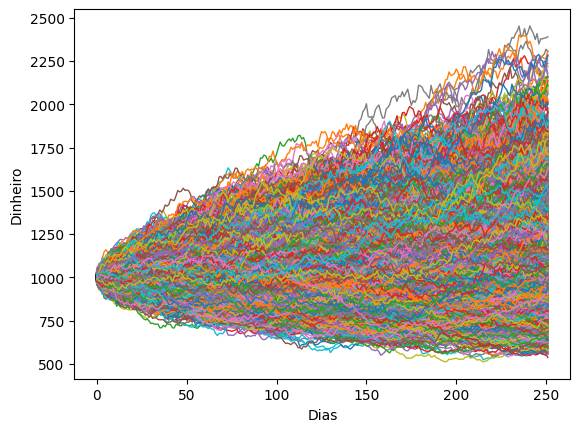

In [20]:
plt.plot(retornos_carteira, linewidth=1)
plt.ylabel("Dinheiro")
plt.xlabel("Dias")
plt.show()

In [21]:
montante_99 = str(np.percentile(montante_final, 1))
montante_95 = str(np.percentile(montante_final, 5))
montante_mediano = str(np.percentile(montante_final, 50))
cenarios_lucro = str((len(montante_final[montante_final > 1000]) / len(montante_final)) * 100) + "%"

In [26]:
print(f"""
        Ao investir R$ 1000,00 na carteira {lista_acoes},
        podemos esperar esses resultados para os próximos 3 anos, utilizando o método de Monte Carlo com 10 mil simulações:

        Com 50% de probabilidade, o montante será maior que {montante_mediano};
        
        Com 95% de probabilidade, o montante será maior que {montante_95};
        
        Com 99% de probabilidade, o montante será maior que {montante_99}.

        Em {cenarios_lucro} dos cenários, foi possível obter lucro no próximo ano.
      
      """)


        Ao investir R$ 1000,00 na carteira ['WEGE3.SA', 'PCAR3.SA', 'LREN3.SA', 'PETR4.SA', 'VALE3.SA'],
        podemos esperar esses resultados para os próximos 3 anos, utilizando o método de Monte Carlo com 10 mil simulações:

        Com 50% de probabilidade, o montante será maior que 1107.1435349815315;
        
        Com 95% de probabilidade, o montante será maior que 779.1169514879375;
        
        Com 99% de probabilidade, o montante será maior que 674.9877356905913.

        Em 68.73% dos cenários, foi possível obter lucro no próximo ano.
      
      


## Utilidades

A partir dessas métricas, é possível calcular coisas como o VAR da carteira para diferentes ibntervalos<br>
de confiança, medindo se o risco que vc está correndo é compatível com o que você aguenta perder. No caso dessa <br>
carteira, uma queda de x% está dentro dos 95% dos cenários mais possíveis de acontecer no próximo ano

Text(0, 0.5, 'Frequência')

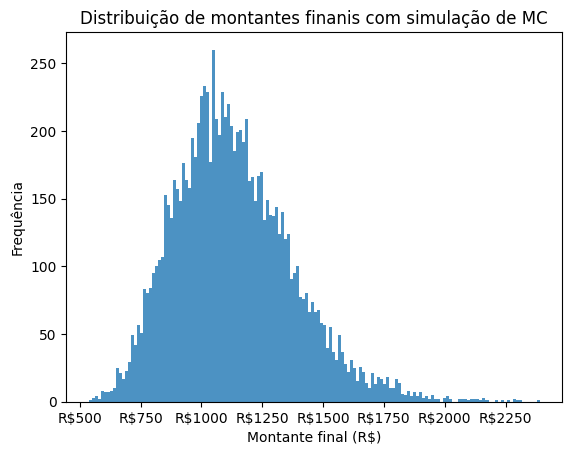

In [27]:
config = dict(histtype="stepfilled", alpha=0.8, density=False, bins=150)
fig, ax = plt.subplots()
ax.hist(montante_final, ** config)
ax.xaxis.set_major_formatter("R${x:.0f}")
plt.title("Distribuição de montantes finanis com simulação de MC")
plt.xlabel("Montante final (R$)")
plt.ylabel("Frequência")